In [1]:
import torch
from torch.optim import Adam
from torch.utils.data import DataLoader

from models.srcnn import SRCNN
from dataset import SISR_Dataset, tensor_to_image_array

import os
import tqdm
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
import cv2

In [2]:
model = SRCNN(32, 2)
trainset = SISR_Dataset(mode='train', size=256, ratio=2)
trainloader = DataLoader(trainset, shuffle=True, num_workers=4, batch_size=16)
validset = SISR_Dataset(mode='valid', size=256, ratio=2)
validloader = DataLoader(validset, shuffle=True, num_workers=4, batch_size=16)
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [3]:
model.cuda()
def compute_loss(pred, label):
    return torch.abs(pred-label).mean()
optim = Adam(model.parameters())

In [4]:
NUM_EPOCH = 200
train_losses = []
valid_losses = []
terminate = 10
count = 0
for e in range(1, NUM_EPOCH+1):
    # training loop
    total_loss = 0
    num_data = 0
    for x, y in trainloader:
        batch_size = x.shape[0]
        x = x.cuda()
        y = y.cuda()
        pred = model(x)
        label = y
        loss = compute_loss(pred, label)
        total_loss += loss
        num_data += batch_size
        optim.zero_grad()
        loss.backward()
        optim.step()
    total_loss /= num_data
    total_loss = total_loss.cpu().detach().numpy()
    train_losses.append(total_loss)
    
    # validation loop
    total_loss = 0
    num_data = 0
    with torch.no_grad():
        for x, y in validloader:
            batch_size = x.shape[0]
            x = x.cuda()
            y = y.cuda()
            pred = model(x)
            label = y
            loss = compute_loss(pred, label)
            total_loss += loss
            num_data += batch_size
    total_loss /= num_data
    total_loss = total_loss.cpu().detach().numpy()
    valid_losses.append(total_loss)
    
    print('[epoch {}/{}] train loss: {:.5} valid loss: {:.5}'.format(e, NUM_EPOCH, train_losses[-1], valid_losses[-1]))
#     if e > 20 and valid_losses[-1] > sum(valid_losses[-20:])/20:
#         count += 1
#         print('validation count: {}/{}'.format(count, terminate))
#     if count == terminate:
#         break

[epoch 1/200] train loss: 0.02586 valid loss: 0.025218
[epoch 2/200] train loss: 0.018788 valid loss: 0.01595
[epoch 3/200] train loss: 0.012327 valid loss: 0.011439
[epoch 4/200] train loss: 0.010233 valid loss: 0.010805
[epoch 5/200] train loss: 0.0096337 valid loss: 0.0098344
[epoch 6/200] train loss: 0.008673 valid loss: 0.0091205
[epoch 7/200] train loss: 0.0077391 valid loss: 0.0082
[epoch 8/200] train loss: 0.0068219 valid loss: 0.007679
[epoch 9/200] train loss: 0.0062183 valid loss: 0.0073003
[epoch 10/200] train loss: 0.0060173 valid loss: 0.0069894
[epoch 11/200] train loss: 0.0056976 valid loss: 0.0065515
[epoch 12/200] train loss: 0.0053142 valid loss: 0.0063438
[epoch 13/200] train loss: 0.0050044 valid loss: 0.0061425
[epoch 14/200] train loss: 0.0046793 valid loss: 0.0061719
[epoch 15/200] train loss: 0.0044833 valid loss: 0.0056713
[epoch 16/200] train loss: 0.0043484 valid loss: 0.0056836
[epoch 17/200] train loss: 0.0041296 valid loss: 0.0054001
[epoch 18/200] train 

[epoch 141/200] train loss: 0.0026037 valid loss: 0.0041007
[epoch 142/200] train loss: 0.0026084 valid loss: 0.0038813
[epoch 143/200] train loss: 0.0025418 valid loss: 0.0040895
[epoch 144/200] train loss: 0.0025484 valid loss: 0.0041457
[epoch 145/200] train loss: 0.002546 valid loss: 0.0039382
[epoch 146/200] train loss: 0.0025023 valid loss: 0.0040248
[epoch 147/200] train loss: 0.0025528 valid loss: 0.0039439
[epoch 148/200] train loss: 0.0025639 valid loss: 0.0040888
[epoch 149/200] train loss: 0.002671 valid loss: 0.0040278
[epoch 150/200] train loss: 0.0026224 valid loss: 0.003929
[epoch 151/200] train loss: 0.0025681 valid loss: 0.0039588
[epoch 152/200] train loss: 0.0025228 valid loss: 0.003998
[epoch 153/200] train loss: 0.0024889 valid loss: 0.0040255
[epoch 154/200] train loss: 0.0025726 valid loss: 0.0041383
[epoch 155/200] train loss: 0.0025271 valid loss: 0.0038628
[epoch 156/200] train loss: 0.0025326 valid loss: 0.0038579
[epoch 157/200] train loss: 0.0025033 valid 

In [5]:
testset = SISR_Dataset(mode='test', size=256, ratio=2)

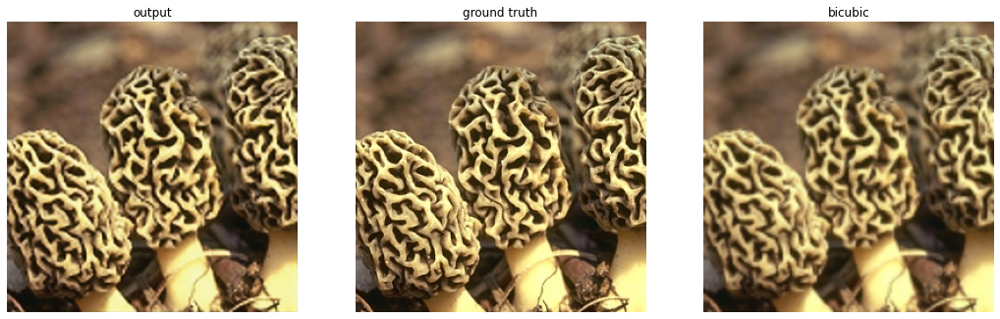

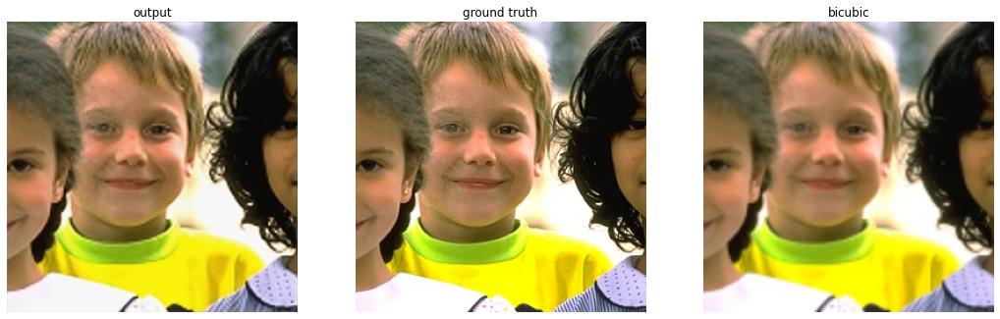

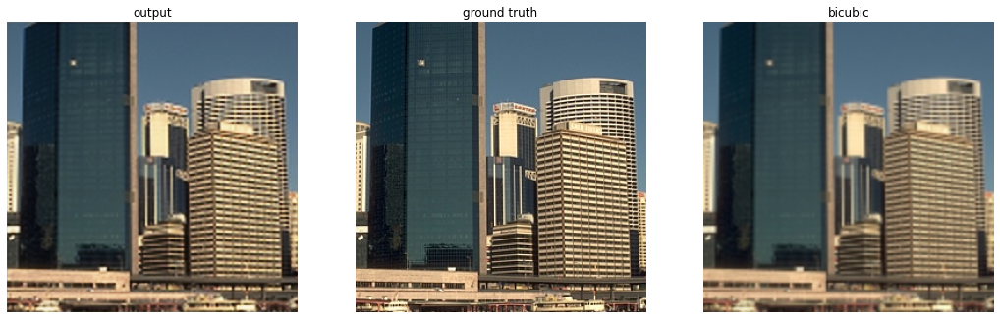

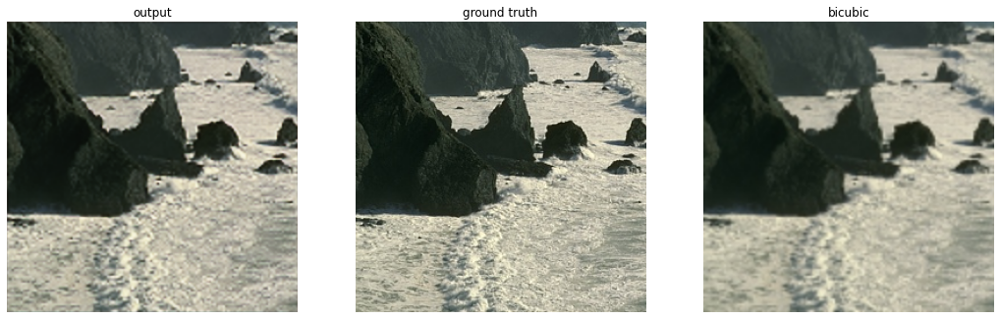

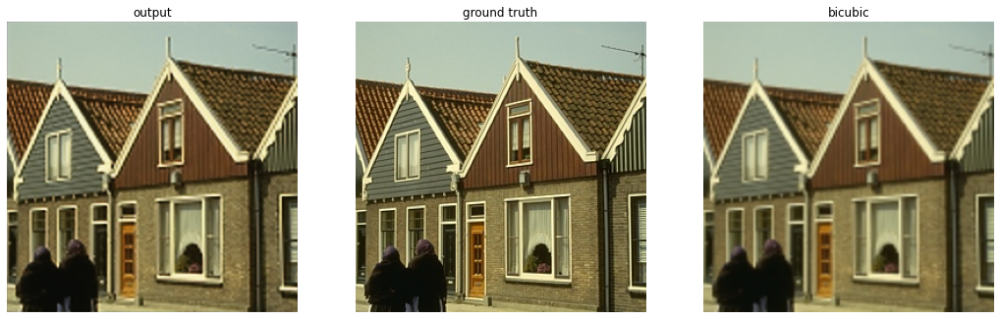

...

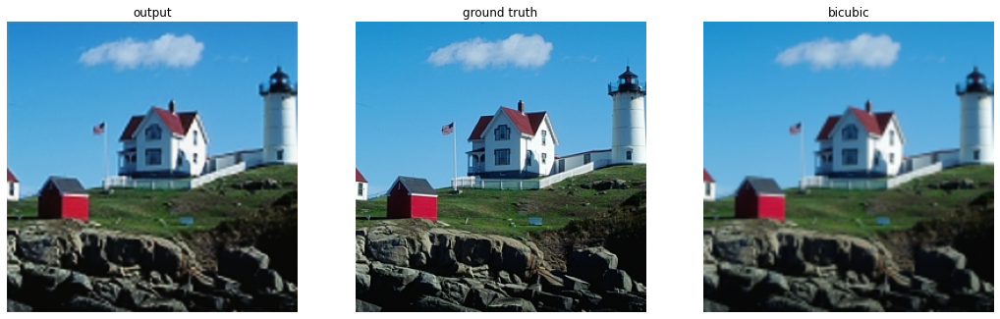

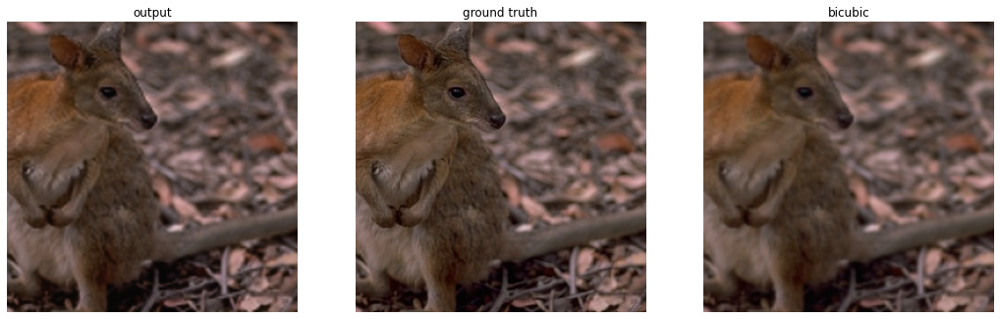

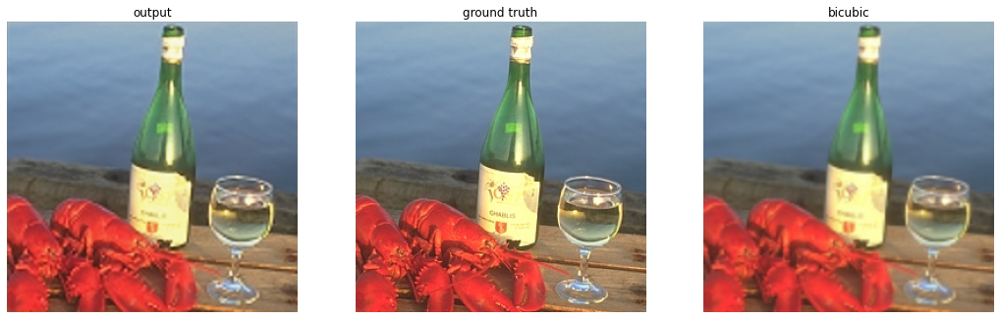

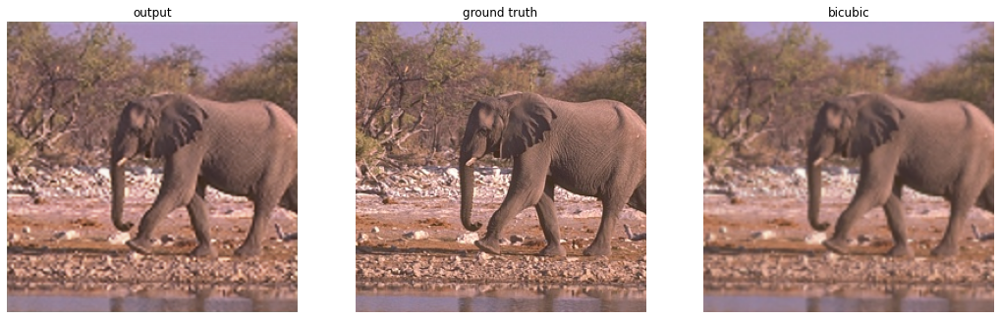

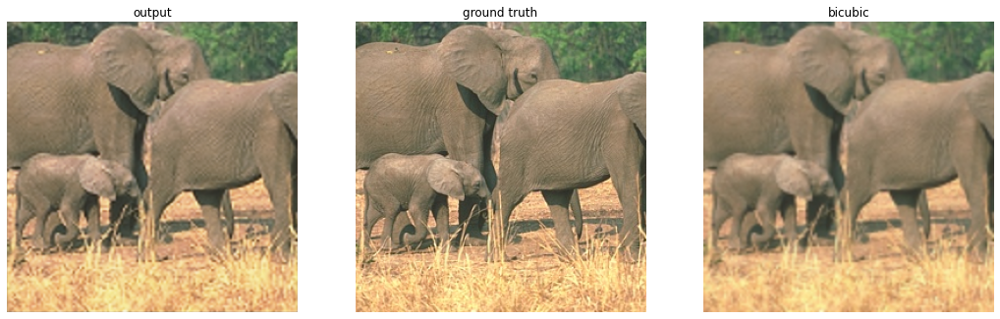

In [9]:
for i in range(20):
    x,y = testset[i]
    x_img = tensor_to_image_array(x)
    y_img = tensor_to_image_array(y)
    model.eval()
    with torch.no_grad():
        pred = model(torch.FloatTensor(x).unsqueeze(0).cuda()).cpu()
    pred_img = tensor_to_image_array(pred)
    bicubic = cv2.resize(x_img, (256, 256), cv2.INTER_CUBIC)
    plt.figure(figsize=(18, 6))
    plt.subplot(131)
    plt.axis('off')
    plt.title('output')
    plt.imshow(pred_img[..., ::-1])
    plt.subplot(132)
    plt.axis('off')
    plt.title('ground truth')
    plt.imshow(y_img[..., ::-1])
    plt.subplot(133)
    plt.axis('off')
    plt.title('bicubic')
    plt.imshow(bicubic[..., ::-1])
    plt.show()

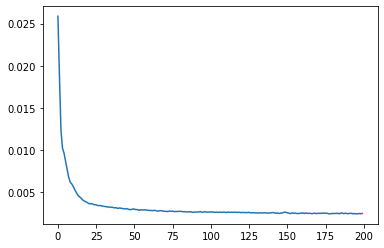

In [7]:
plt.plot(train_losses)
plt.show()

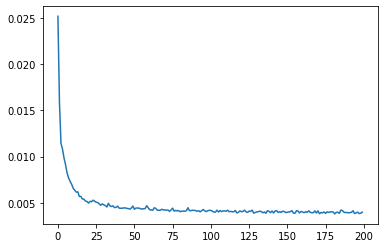

In [8]:
plt.plot(valid_losses)
plt.show()